# Project 1: EDA - Kings County

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import datetime
from scipy import stats
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

## Read the file and see the data

In [2]:
df = pd.read_csv("data/King_County_House_prices_dataset.csv", na_values="?")
print(type(df))
df.head()

<class 'pandas.core.frame.DataFrame'>


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [3]:
# just to have it
print(f"Length: {len(df)}")
print(f"Shape: {df.shape}")

Length: 21597
Shape: (21597, 21)


## Drop useless, deal with NaN, check for outliners

In [4]:
# drop "id" column
df.drop("id", inplace=True, axis=1)
df.head(1)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.0,3,1.0,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650


In [5]:
# check for missings
missing = pd.DataFrame(df.isnull().sum(),columns=['Number'])
missing['Percentage'] = round(missing.Number/df.shape[0]*100,1)
missing[missing.Number!=0]

,Number,Percentage
waterfront,2376,11.0
view,63,0.3
sqft_basement,454,2.1
yr_renovated,3842,17.8


In [6]:
df.fillna(0, inplace=True)

In [7]:
# hopefully no negatives
print(df.min())

date             1/10/2015
price                78000
bedrooms                 1
bathrooms              0.5
sqft_living            370
sqft_lot               520
floors                   1
waterfront               0
view                     0
condition                1
grade                    3
sqft_above             370
sqft_basement            0
yr_built              1900
yr_renovated             0
zipcode              98001
lat                47.1559
long              -122.519
sqft_living15          399
sqft_lot15             651
dtype: object


In [8]:
# checking for outliners
print(df.max())

date             9/9/2014
price             7.7e+06
bedrooms               33
bathrooms               8
sqft_living         13540
sqft_lot          1651359
floors                3.5
waterfront              1
view                    4
condition               5
grade                  13
sqft_above           9410
sqft_basement        4820
yr_built             2015
yr_renovated         2015
zipcode             98199
lat               47.7776
long             -121.315
sqft_living15        6210
sqft_lot15         871200
dtype: object


In [9]:
# found bedrooms
df[df["bedrooms"] >= 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.0,11,3.00,3000,4960,2.0,0.0,0.0,3,7,2400,600.0,1918,1999.0,98106,47.5560,-122.363,1420,4960
13301,8/14/2014,1150000.0,10,5.25,4590,10920,1.0,0.0,2.0,3,9,2500,2090.0,2008,0.0,98004,47.5861,-122.113,2730,10400
15147,10/29/2014,650000.0,10,2.00,3610,11914,2.0,0.0,0.0,4,7,3010,600.0,1958,0.0,98006,47.5705,-122.175,2040,11914
15856,6/25/2014,640000.0,33,1.75,1620,6000,1.0,0.0,0.0,5,7,1040,580.0,1947,0.0,98103,47.6878,-122.331,1330,4700
19239,12/29/2014,660000.0,10,3.00,2920,3745,2.0,0.0,0.0,4,7,1860,1060.0,1913,0.0,98105,47.6635,-122.320,1810,3745


In [10]:
# find and remove outliers outliners are "bedrooms" > 10
df.bedrooms = df.bedrooms.apply(lambda x: None if x > 10 else x)
# and the one (line 15147) with 10 to 2 bedrooms bathrooms ratio
df.bedrooms.drop([15147], axis=0)
df[df["bedrooms"] >= 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
13301,8/14/2014,1150000.0,10.0,5.25,4590,10920,1.0,0.0,2.0,3,9,2500,2090.0,2008,0.0,98004,47.5861,-122.113,2730,10400
15147,10/29/2014,650000.0,10.0,2.00,3610,11914,2.0,0.0,0.0,4,7,3010,600.0,1958,0.0,98006,47.5705,-122.175,2040,11914
19239,12/29/2014,660000.0,10.0,3.00,2920,3745,2.0,0.0,0.0,4,7,1860,1060.0,1913,0.0,98105,47.6635,-122.320,1810,3745


In [11]:
# looks great, outliners are removed
print(df.max())

date             9/9/2014
price             7.7e+06
bedrooms               10
bathrooms               8
sqft_living         13540
sqft_lot          1651359
floors                3.5
waterfront              1
view                    4
condition               5
grade                  13
sqft_above           9410
sqft_basement        4820
yr_built             2015
yr_renovated         2015
zipcode             98199
lat               47.7776
long             -121.315
sqft_living15        6210
sqft_lot15         871200
dtype: object


In [12]:
# checking data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
date             21597 non-null object
price            21597 non-null float64
bedrooms         21595 non-null float64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(10), int64(9), object(1)
memory usage: 3.3+ MB


In [13]:
# df is about one year 09.09.2014 to 01.10.2019
# dateobject to int = YYYMMDD
df["date"] = pd.to_datetime(df["date"]).dt.strftime("%y%m%d")

In [14]:
# ceck
df[200:205]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
200,150311,210000.0,3.0,1.0,860,11725,1.0,0.0,0.0,4,6,860,0.0,1943,0.0,98056,47.5093,-122.184,1300,9514
201,141112,297000.0,3.0,2.5,1940,14952,2.0,0.0,0.0,3,8,1940,0.0,1994,0.0,98042,47.3777,-122.165,2030,10450
202,140716,470000.0,3.0,1.0,1010,5000,1.0,0.0,0.0,3,7,1010,0.0,1952,0.0,98107,47.6750,-122.394,1680,5000
203,140804,226500.0,3.0,1.5,1300,7370,1.0,0.0,0.0,4,7,900,400.0,1976,0.0,98023,47.3025,-122.370,1430,7500
204,150303,274250.0,3.0,1.0,910,8450,1.0,0.0,0.0,4,6,910,0.0,1962,0.0,98059,47.4787,-122.158,1400,8040


In [15]:
# still transformation to int() needed
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
date             21597 non-null object
price            21597 non-null float64
bedrooms         21595 non-null float64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null float64
view             21597 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(10), int64(9), object(1)
memory usage: 3.3+ MB


In [16]:
df["waterfront"] = df["waterfront"].astype(int)
df["view"] = df["view"].astype(int)
df["yr_renovated"] = df["date"].astype(int)

df["date"] = df["date"].astype(int)
df.head(1)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,141013,221900.0,3.0,1.0,1180,5650,1.0,0,0,3,7,1180,0.0,1955,141013,98178,47.5112,-122.257,1340,5650


In [17]:
# better save than sorry
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
date             21597 non-null int64
price            21597 non-null float64
bedrooms         21595 non-null float64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null int64
view             21597 non-null int64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null int64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(7), int64(13)
memory usage: 3.3 MB


In [18]:
# all elem in list are pot features, but "sqft_basement" has to be transformed
pot_features = list(df.columns)
pot_features

['date',
 'price',
 'bedrooms',
 'bathrooms',
 'sqft_living',
 'sqft_lot',
 'floors',
 'waterfront',
 'view',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'lat',
 'long',
 'sqft_living15',
 'sqft_lot15']

## Adding feature

In [19]:
## Price sqft_living
series_sqft_living_price = round(df["price"] / df["sqft_living"], 2)
series_sqft_living_price.name = "sqft_l_price"
print(series_sqft_living_price.head(3))
df = df.join(series_sqft_living_price)

0    188.05
1    209.34
2    233.77
Name: sqft_l_price, dtype: float64


## Queryies

In [20]:
# fresh new dataframs for graphics
df_less_250k = df[df["price"] < 250001]

# cool querys
df_less_500k = df.query('price >= 250000 and price <= 500000')
df_less_1mio = df.query('price >= 500000 and price <= 1000000')

# better price per sqft than mean = 264.14
df_better_pricesqft = df.query('sqft_l_price < 264.14')

In [21]:
df.describe().round(2)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,sqft_l_price
count,21597.00,21597.00,21595.00,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,...,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00,21597.00
mean,143902.70,540296.57,3.37,2.12,2080.32,15099.41,1.49,0.01,0.23,3.41,...,1788.60,285.72,1971.00,143902.70,98077.95,47.56,-122.21,1986.62,12758.28,264.14
std,4436.65,367368.14,0.90,0.77,918.11,41412.64,0.54,0.08,0.76,0.65,...,827.76,439.82,29.38,4436.65,53.51,0.14,0.14,685.23,27274.44,110.00
min,140502.00,78000.00,1.00,0.50,370.00,520.00,1.00,0.00,0.00,1.00,...,370.00,0.00,1900.00,140502.00,98001.00,47.16,-122.52,399.00,651.00,87.59
25%,140722.00,322000.00,3.00,1.75,1430.00,5040.00,1.00,0.00,0.00,3.00,...,1190.00,0.00,1951.00,140722.00,98033.00,47.47,-122.33,1490.00,5100.00,182.29
50%,141016.00,450000.00,3.00,2.25,1910.00,7618.00,1.50,0.00,0.00,3.00,...,1560.00,0.00,1975.00,141016.00,98065.00,47.57,-122.23,1840.00,7620.00,244.64
75%,150217.00,645000.00,4.00,2.50,2550.00,10685.00,2.00,0.00,0.00,4.00,...,2210.00,550.00,1997.00,150217.00,98118.00,47.68,-122.12,2360.00,10083.00,318.33
max,150527.00,7700000.00,10.00,8.00,13540.00,1651359.00,3.50,1.00,4.00,5.00,...,9410.00,4820.00,2015.00,150527.00,98199.00,47.78,-121.32,6210.00,871200.00,810.14


## Graphics and maps

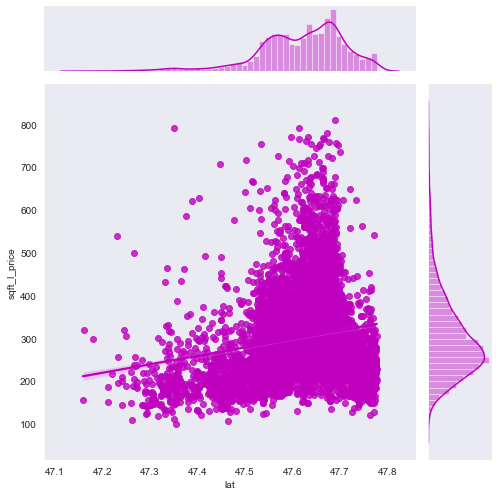

In [22]:
# upper class objects
sns.set_style(style="dark")
g = sns.jointplot(x="lat", y="sqft_l_price", data=df_less_1mio,
                  kind="reg", truncate=True,
                  color="m", height=7)
plt.savefig('figures/jointplot-sqft_above-price_less_500k.png')

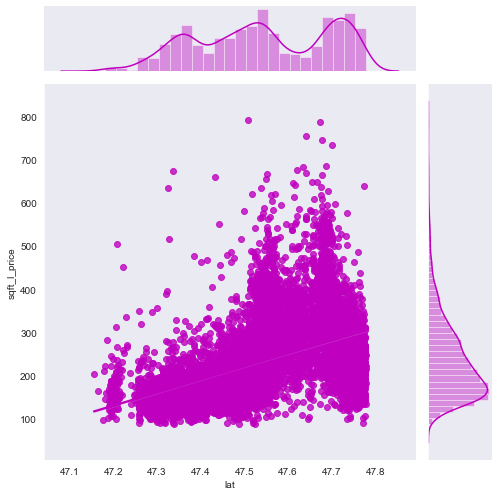

In [23]:
# upper middle class objects
g = sns.jointplot(x="lat", y="sqft_l_price", data=df_less_500k,
                  kind="reg", truncate=True,
                  color="m", height=7)
plt.savefig('figures/jointplot-sqft_above-price_less_500k.png')

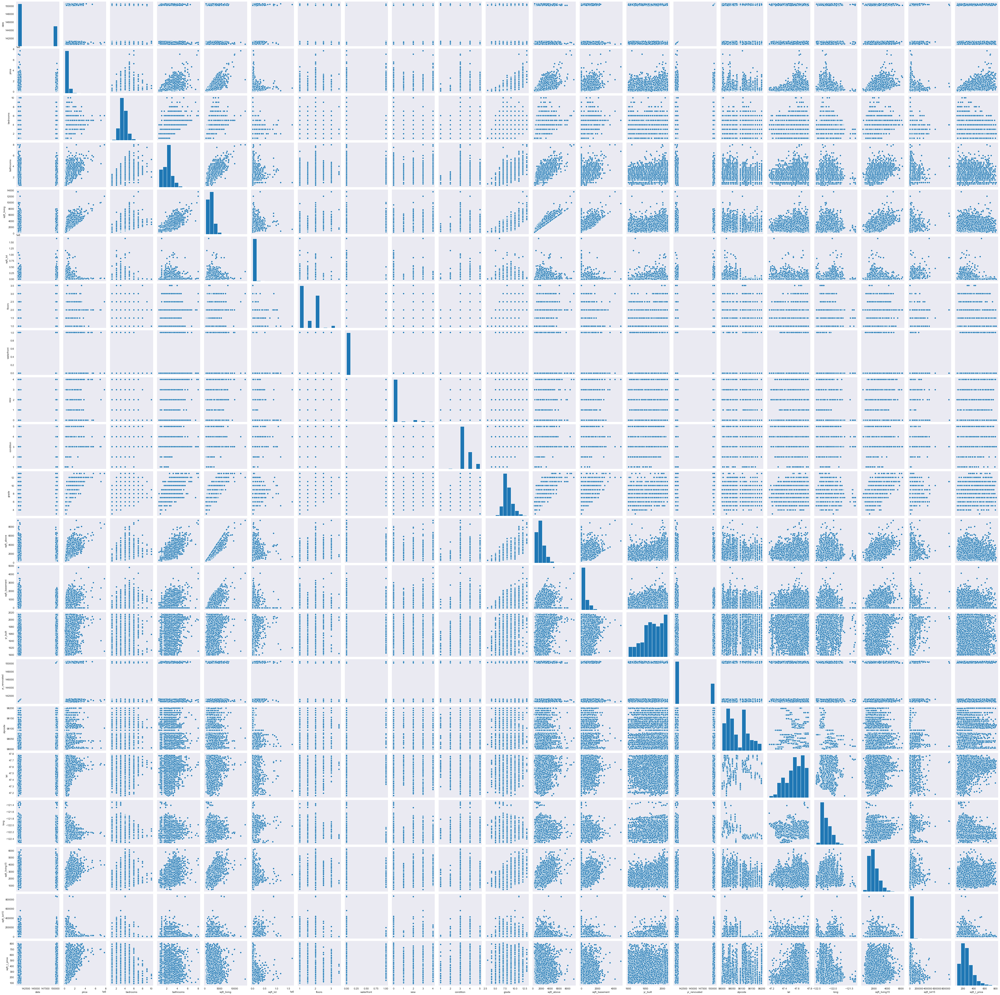

In [24]:
# start with a pairplot
sns.pairplot(df)
plt.savefig('figures/pairplot.png')

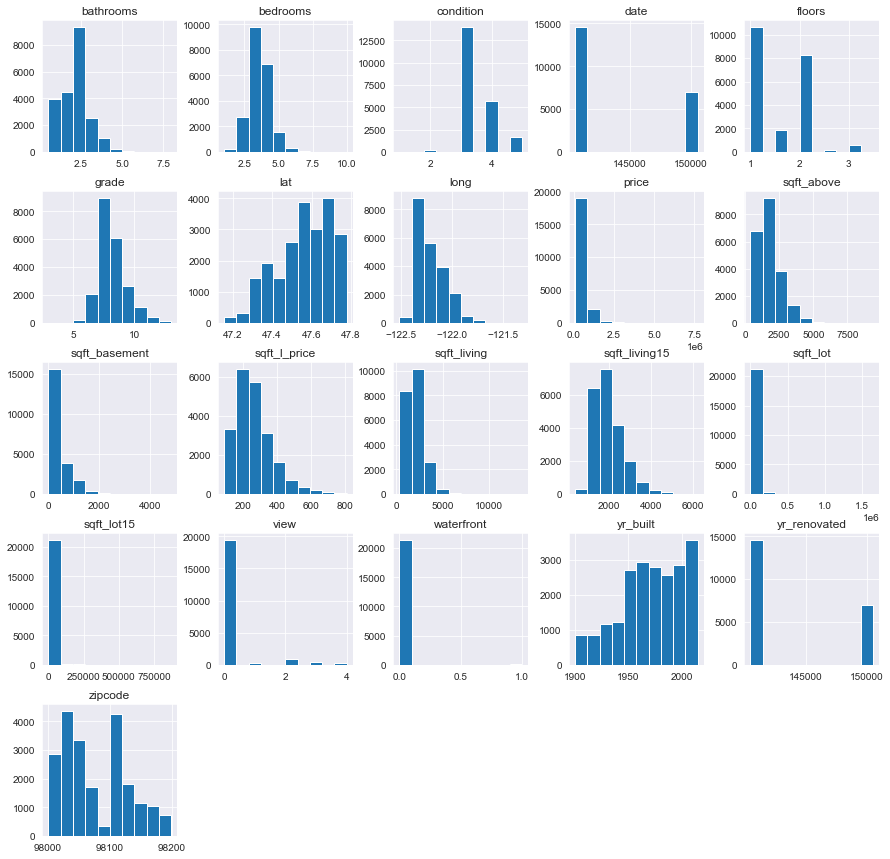

In [25]:
_ = df.hist(figsize=(15,15))
plt.savefig('figures/hist_all.png')

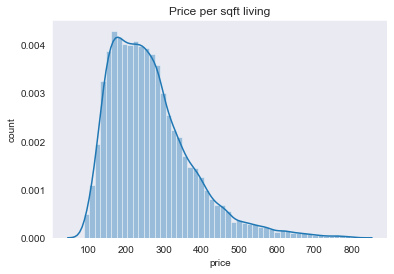

In [26]:
sns.distplot(df["sqft_l_price"])
plt.title("Price per sqft living")
plt.xlabel("price")
plt.ylabel("count")
plt.savefig('figures/dist-prics_sqft.png')

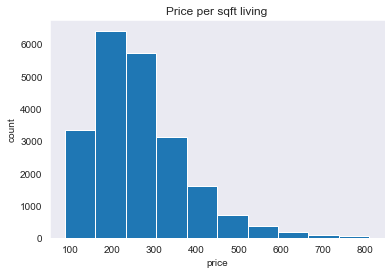

In [27]:
plt.hist(df["sqft_l_price"])
plt.title("Price per sqft living")
plt.xlabel("price")
plt.ylabel("count")
plt.savefig('figures/hist-price_sqft.png')
plt.show()

<strong>Summery</strong>

All data is now clean and ready to be processed in a linear regression.

## Maps

In [28]:
import plotly.express as px
fig = px.density_mapbox(df, lat='lat', lon='long', z='price', radius=4,
                        center=dict(lat=47.5, lon=-122.2), zoom=8.5, opacity=1,
                        title="Real Estate Regional Density Map",
                        mapbox_style="open-street-map")
fig.show()

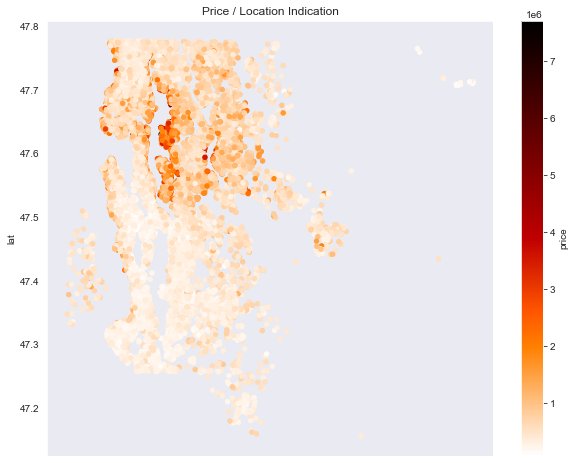

In [29]:
df.plot(kind="scatter", x="long", c="price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Price / Location Indication");
plt.savefig('figures/cluster-scatter.png')
plt.show()

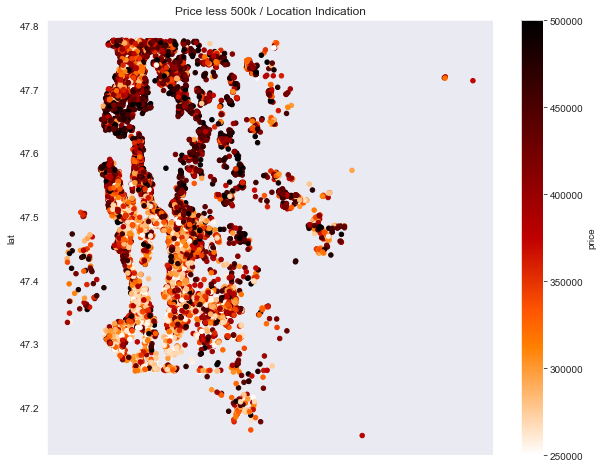

In [30]:
df_less_500k.plot(kind="scatter", x="long", c="price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Price less 500k / Location Indication");
plt.savefig('figures/cluster-scatter-less500k.png')
plt.show()

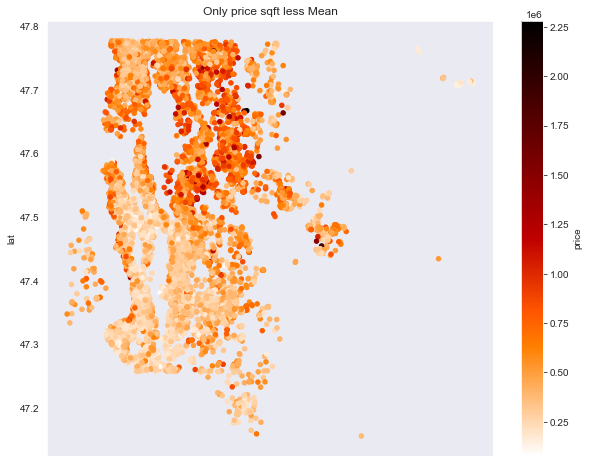

In [31]:
df_better_pricesqft.plot(kind="scatter", x="long", c="price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Only price sqft less Mean");
plt.savefig('figures/cluster-price_sqft_mean.png')
plt.show()

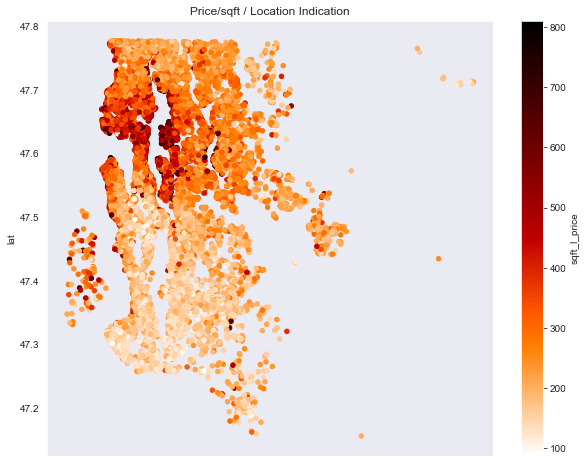

In [32]:
df.plot(kind="scatter", x="long", c="sqft_l_price", y="lat", figsize=(10, 8),
             cmap="gist_heat_r", colorbar=True, title="Price/sqft / Location Indication");
plt.savefig('figures/cluster-price_sqft.png')
plt.show()

## Correlation analysis

In [33]:
continuous_var = ['date',
                  'price',
                  'sqft_living',
                  'sqft_lot',
                  'sqft_above',
                  'sqft_basement',
                  'yr_built',
                  'yr_renovated',
                  'lat',
                  'long',
                  'sqft_living15',
                  'sqft_lot15',
                  "sqft_l_price"]

In [34]:
categorical_var = ["waterfront",
                   "condition",
                   "grade",
                   'floors',
                   'view',
                   'bedrooms',
                   'bathrooms',
                   "zipcode"]

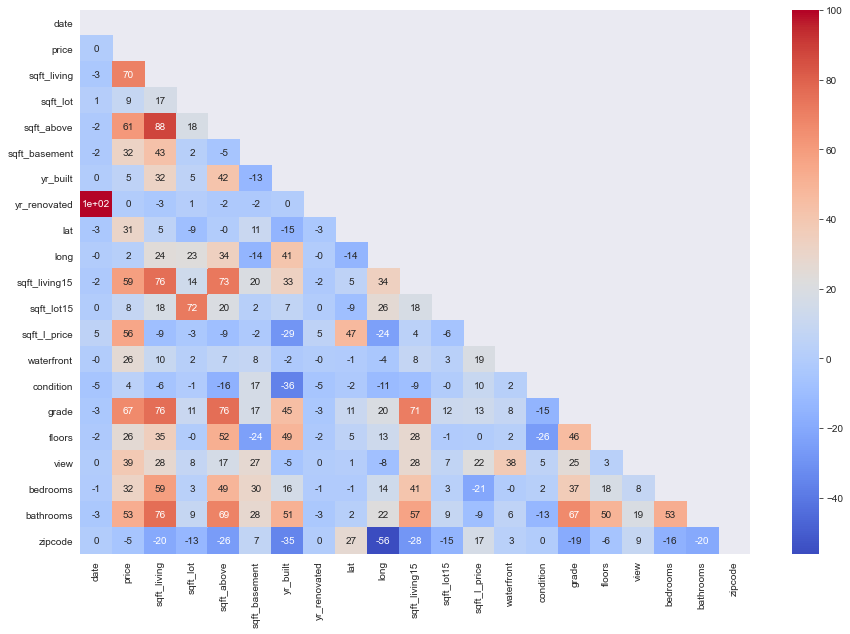

In [35]:
fig, ax = plt.subplots(figsize=(15,10))


df_dum = pd.get_dummies(df[continuous_var+categorical_var].copy())
mask = np.triu(df_dum.corr())
ax = sns.heatmap(round(df_dum.corr()*100,0)
                 ,annot=True
                 ,mask=mask
                 ,cmap="coolwarm")
                 
plt.savefig('figures/correlogram.png')

## Export

In [36]:
df.to_csv("data/df_clean.csv")